In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler

from sklearn.feature_selection import RFE

from sklearn.pipeline import Pipeline
from sklearn.model_selection import train_test_split
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score

from sklearn.linear_model import LogisticRegression
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.naive_bayes import GaussianNB

from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import pickle

import warnings
warnings.filterwarnings('ignore')

In [ ]:
from google.colab import files
uploaded = files.upload()
#/content/sample_data

Saving data_2.csv.xlsx to data_2.csv.xlsx


In [ ]:
data = pd.read_excel('data_2.csv.xlsx') # reading the file
print('Data read successfully')

data_1 = data.copy() #copying the file

data.head() #displaying the contents of the file upto 5 rows

Data read successfully


,MEAN_RR,MEDIAN_RR,SDRR,RMSSD,SDSD,SDRR_RMSSD,HR,pNN25,pNN50,SD1,...,LF_NU,HF,HF_PCT,HF_NU,TP,LF_HF,HF_LF,sampen,higuci,condition
0,756.707933,747.941620,143.968457,13.357748,13.356388,10.777899,82.092049,5.933333,0.666667,9.447545,...,93.707747,35.199054,0.662879,6.292253,5310.027472,14.892559,0.067148,1.912191,1.128098,0
1,832.894819,834.290000,84.999202,14.147805,14.147257,6.007943,72.816960,7.400000,0.000000,10.006960,...,98.463025,14.771837,0.594187,1.536975,2486.058114,64.062874,0.015610,2.186655,1.183980,0
2,997.711161,998.858135,80.215509,22.116768,22.116729,3.626909,60.537570,26.866667,1.933333,15.644108,...,99.480694,8.956415,0.245826,0.519306,3643.391597,191.564789,0.005220,2.197198,1.224772,0
3,805.624305,807.941995,48.318189,14.754796,14.754765,3.274745,74.750221,9.800000,0.000000,10.436676,...,92.087966,49.582617,4.398293,7.912034,1127.315065,11.638975,0.085918,2.160851,1.327102,0
4,774.055210,776.478915,67.846192,15.906573,15.906464,4.265293,78.131408,11.933333,0.000000,11.251322,...,90.080584,87.579847,4.547201,9.919416,1926.016560,9.081238,0.110117,2.202761,1.302500,0


In [ ]:
data.isna().sum()
# missing values for detecing missing values 

MEAN_RR          0
MEDIAN_RR        0
SDRR             0
RMSSD            0
SDSD             0
SDRR_RMSSD       0
HR               0
pNN25            0
pNN50            0
SD1              0
SD2              0
KURT             0
SKEW             0
MEAN_REL_RR      0
MEDIAN_REL_RR    0
VLF              0
VLF_PCT          0
LF               0
LF_PCT           0
LF_NU            0
HF               0
HF_PCT           0
HF_NU            0
TP               0
LF_HF            0
HF_LF            0
sampen           0
higuci           0
condition        0
dtype: int64

In [ ]:
data.shape #dimension of the dataframe
data.info() #shows Dtype, colums, null values
data.describe(include='all')  # gives stats 
#data.corr()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 399 entries, 0 to 398
Data columns (total 29 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MEAN_RR        399 non-null    float64
 1   MEDIAN_RR      399 non-null    float64
 2   SDRR           399 non-null    float64
 3   RMSSD          399 non-null    float64
 4   SDSD           399 non-null    float64
 5   SDRR_RMSSD     399 non-null    float64
 6   HR             399 non-null    float64
 7   pNN25          399 non-null    float64
 8   pNN50          399 non-null    float64
 9   SD1            399 non-null    float64
 10  SD2            399 non-null    float64
 11  KURT           399 non-null    float64
 12  SKEW           399 non-null    float64
 13  MEAN_REL_RR    399 non-null    float64
 14  MEDIAN_REL_RR  399 non-null    float64
 15  VLF            399 non-null    float64
 16  VLF_PCT        399 non-null    float64
 17  LF             399 non-null    float64
 18  LF_PCT    

,MEAN_RR,MEDIAN_RR,SDRR,RMSSD,SDSD,SDRR_RMSSD,HR,pNN25,pNN50,SD1,...,LF_NU,HF,HF_PCT,HF_NU,TP,LF_HF,HF_LF,sampen,higuci,condition
count,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,...,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000,399.000000
mean,891.512678,888.239258,117.230689,15.592368,15.591777,7.484909,70.278072,10.992481,0.913116,11.028731,...,96.451917,31.516029,1.294481,3.548083,3555.554259,156.304058,0.038379,2.093435,1.180166,0.498747
std,131.502520,135.697736,75.634105,3.870853,3.870727,4.249216,10.163688,7.993409,0.961436,2.737930,...,3.638244,39.749566,1.613474,3.638244,2171.528012,439.908655,0.042495,0.131559,0.070006,0.500626
min,564.327382,523.220580,39.437288,8.251797,8.251705,2.879955,48.903356,0.400000,0.000000,5.836784,...,73.181805,0.074489,0.004378,0.016297,687.246374,2.728812,0.000163,1.543845,1.038506,0.000000
25%,799.327763,791.026813,65.923484,13.205384,13.203434,4.848280,63.154105,5.433333,0.133333,9.339354,...,94.587883,7.794655,0.198248,0.785784,1950.953911,17.477822,0.007920,2.051482,1.130261,0.000000
50%,871.321577,863.257510,90.657758,15.045554,15.045321,5.934539,70.432698,9.066667,0.666667,10.642199,...,97.624491,19.197361,0.713848,2.375509,3110.161475,41.096241,0.024333,2.138191,1.177995,0.000000
75%,976.594423,977.651592,140.896491,18.232683,18.232219,8.328899,76.432908,14.933333,1.533333,12.896428,...,99.214216,36.717565,1.687762,5.412117,4400.809321,126.315697,0.057218,2.182631,1.223824,1.000000
max,1281.459306,1269.400550,416.725730,25.965793,25.965792,23.662902,110.841525,37.533333,4.333333,18.366715,...,99.983703,311.184400,9.512592,26.818195,12730.761750,6135.284545,0.366460,2.233961,1.357564,1.000000


In [ ]:
data.shape #dimension of the dataframe
data.info() #shows Dtype, colums, null values
data.describe(include='all')  # gives stats 
data.corr() #spearson correlation

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 399 entries, 0 to 398
Data columns (total 29 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   MEAN_RR        399 non-null    float64
 1   MEDIAN_RR      399 non-null    float64
 2   SDRR           399 non-null    float64
 3   RMSSD          399 non-null    float64
 4   SDSD           399 non-null    float64
 5   SDRR_RMSSD     399 non-null    float64
 6   HR             399 non-null    float64
 7   pNN25          399 non-null    float64
 8   pNN50          399 non-null    float64
 9   SD1            399 non-null    float64
 10  SD2            399 non-null    float64
 11  KURT           399 non-null    float64
 12  SKEW           399 non-null    float64
 13  MEAN_REL_RR    399 non-null    float64
 14  MEDIAN_REL_RR  399 non-null    float64
 15  VLF            399 non-null    float64
 16  VLF_PCT        399 non-null    float64
 17  LF             399 non-null    float64
 18  LF_PCT    

,MEAN_RR,MEDIAN_RR,SDRR,RMSSD,SDSD,SDRR_RMSSD,HR,pNN25,pNN50,SD1,...,LF_NU,HF,HF_PCT,HF_NU,TP,LF_HF,HF_LF,sampen,higuci,condition
MEAN_RR,1.000000,0.981273,0.571756,0.332312,0.332226,0.502233,-0.946417,0.271210,0.322117,0.332226,...,0.619025,-0.572847,-0.649123,-0.619025,0.558421,0.415642,-0.596439,0.067917,-0.575573,0.250059
MEDIAN_RR,0.981273,1.000000,0.477860,0.320557,0.320484,0.401647,-0.947047,0.272841,0.279563,0.320484,...,0.629424,-0.594305,-0.633993,-0.629424,0.485682,0.415815,-0.607129,0.147138,-0.530114,0.239709
SDRR,0.571756,0.477860,1.000000,0.320258,0.320100,0.949096,-0.344145,0.168166,0.547008,0.320100,...,0.106546,-0.016894,-0.340949,-0.106546,0.844385,0.041845,-0.100229,-0.445803,-0.608237,0.205666
RMSSD,0.332312,0.320557,0.320258,1.000000,1.000000,0.031891,-0.286543,0.957033,0.781380,1.000000,...,0.216502,0.249695,-0.140467,-0.216502,0.540467,0.132641,-0.197300,-0.028612,-0.051266,-0.148062
SDSD,0.332226,0.320484,0.320100,1.000000,1.000000,0.031725,-0.286499,0.957057,0.781320,1.000000,...,0.216502,0.249693,-0.140433,-0.216502,0.540357,0.132642,-0.197300,-0.028546,-0.051158,-0.148132
SDRR_RMSSD,0.502233,0.401647,0.949096,0.031891,0.031725,1.000000,-0.280155,-0.103424,0.322132,0.031725,...,0.077404,-0.103235,-0.334642,-0.077404,0.714119,0.001239,-0.075981,-0.463763,-0.637623,0.256815
HR,-0.946417,-0.947047,-0.344145,-0.286543,-0.286499,-0.280155,1.000000,-0.249784,-0.193206,-0.286499,...,-0.695114,0.674766,0.670044,0.695114,-0.384298,-0.390575,0.677121,-0.229848,0.462267,-0.219490
pNN25,0.271210,0.272841,0.168166,0.957033,0.957057,-0.103424,-0.249784,1.000000,0.669924,0.957057,...,0.241160,0.211153,-0.103604,-0.241160,0.400663,0.141865,-0.223607,0.088696,0.036450,-0.218481
pNN50,0.322117,0.279563,0.547008,0.781380,0.781320,0.322132,-0.193206,0.669924,1.000000,0.781320,...,0.076444,0.288358,-0.137721,-0.076444,0.688794,0.042674,-0.065346,-0.216488,-0.238273,-0.004055
SD1,0.332226,0.320484,0.320100,1.000000,1.000000,0.031725,-0.286499,0.957057,0.781320,1.000000,...,0.216502,0.249693,-0.140433,-0.216502,0.540357,0.132642,-0.197300,-0.028546,-0.051158,-0.148132


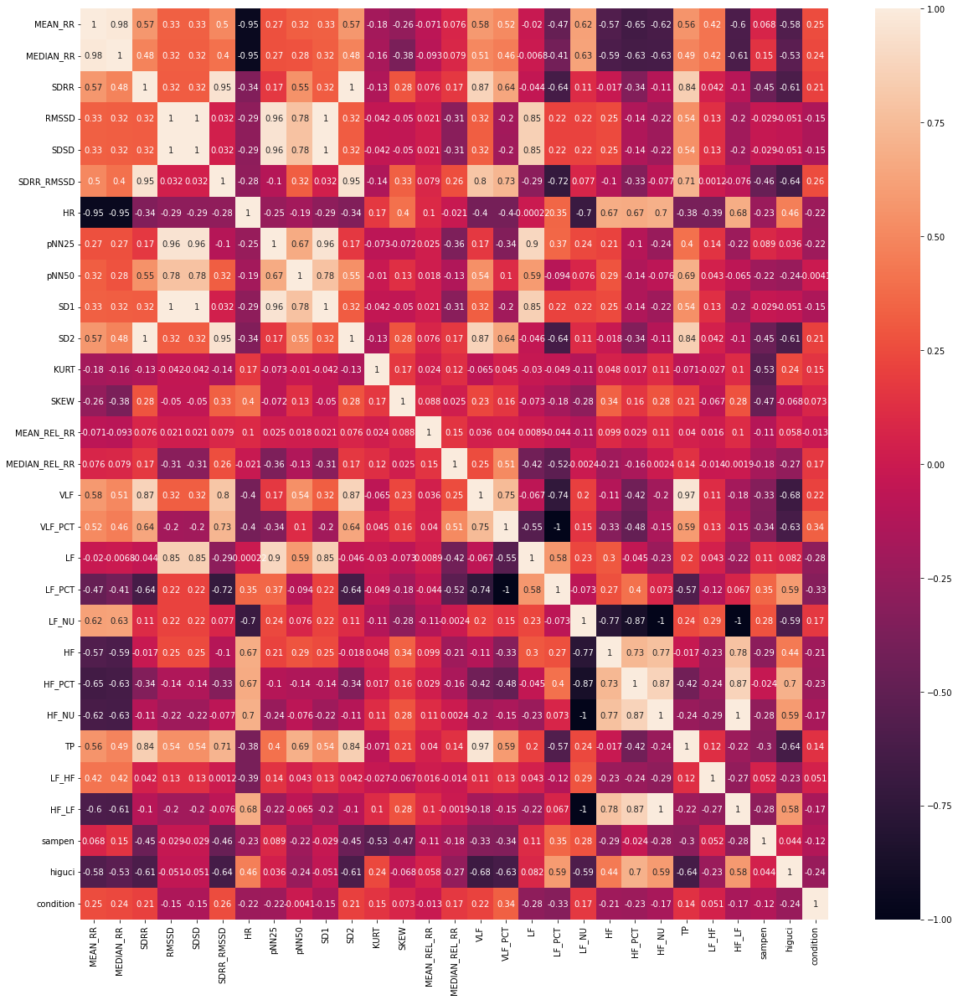

In [ ]:
plt.figure(figsize=(20, 20))
sns.heatmap(data.corr(), annot=True)
plt.show()

Class Labels: 
 0    200
1    199
Name: condition, dtype: int64


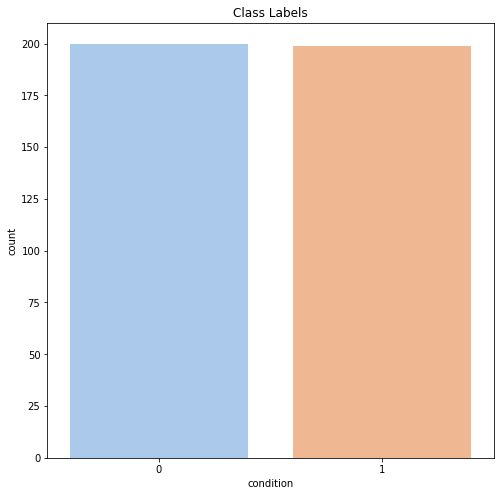

In [ ]:
print('Class Labels: \n', data['condition'].value_counts())
plt.figure(figsize=(8,8))
plt.title('Class Labels')
sns.countplot(data['condition'],palette='pastel')

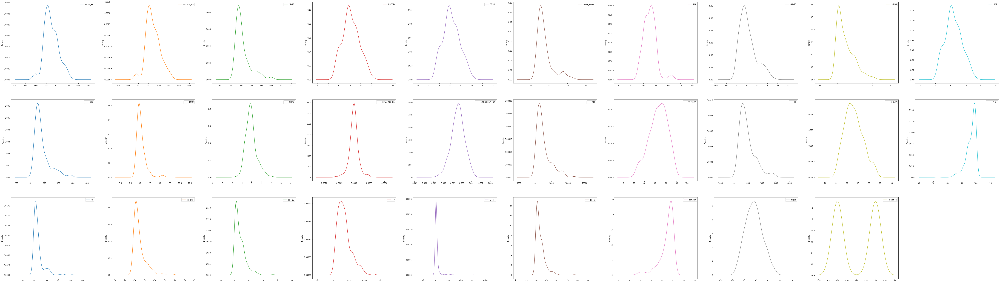

In [ ]:
fig = plt.figure(figsize=(100, 100))
ax = fig.gca()
data.plot(kind='density', subplots=True, layout=(10, 10), sharex=False, ax=ax)
plt.show()

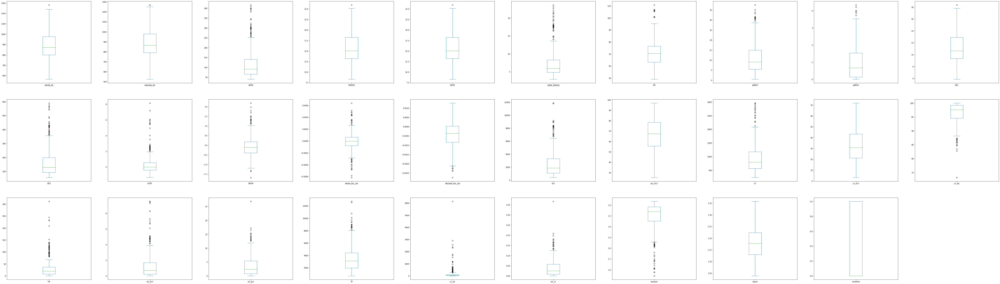

In [ ]:
fig = plt.figure(figsize=(100, 100))
ax = fig.gca()
data.plot(kind='box', subplots=True, layout=(10, 10), sharex=False, ax=ax)
plt.show()

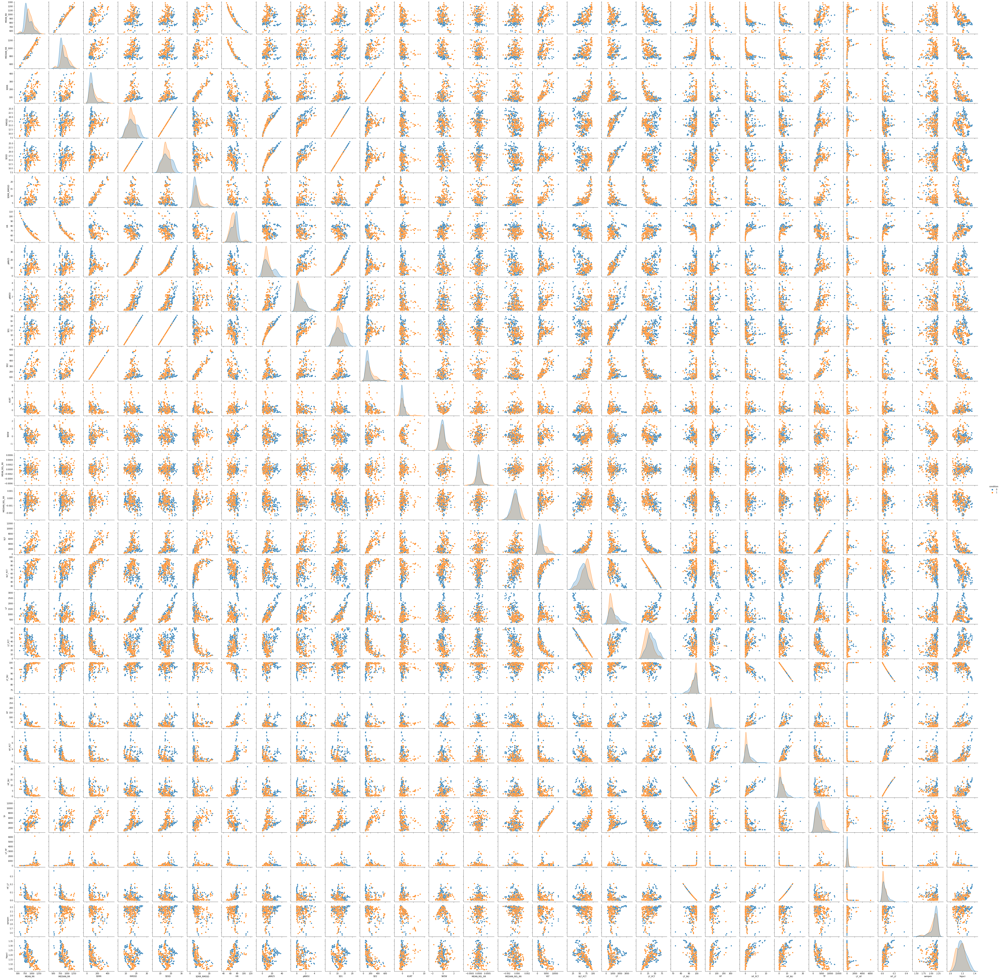

In [ ]:
sns.pairplot(data,hue='condition')

In [ ]:

array = data_1.values
X = array[:, :28]
Y = array[:, 28]

In [ ]:
x_train, x_test, y_train, y_test = train_test_split(X, Y, test_size=0.67, random_state=1)

In [ ]:
# Standard Scalar
scalar = StandardScaler()
rescaled_X = scalar.fit_transform(x_train)
print(rescaled_X[:50])

[[ 0.27085297  0.27053677 -0.35049157 ... -0.51825194  0.47056426
   0.91145273]
 [-0.79431434 -0.72654474 -0.94811088 ...  1.87966417  0.60484218
   1.22603133]
 [-0.91697073 -0.89741578 -0.40702525 ... -0.01794971  0.95417482
   0.31366679]
 ...
 [ 0.16505695  0.23672254 -0.39957138 ... -0.70948671  0.34866019
  -0.19667682]
 [ 2.0917187   1.54449948  2.2384525  ... -0.85772757 -1.62337021
  -1.37662569]
 [-0.62938725 -0.58064823 -0.93340135 ...  0.36937891  0.59434602
   1.17107329]]


In [ ]:
# with scaled data
model = LogisticRegression()
rfe = RFE(model,)
fit = rfe.fit(rescaled_X, y_train)
transformed_X = fit.transform(rescaled_X)
print(data_1.columns)
print('Num features : ', fit.n_features_)
print('Selected features : ', fit.support_)
print('Features ranking : ', fit.ranking_)

Index(['MEAN_RR', 'MEDIAN_RR', 'SDRR', 'RMSSD', 'SDSD', 'SDRR_RMSSD', 'HR',
       'pNN25', 'pNN50', 'SD1', 'SD2', 'KURT', 'SKEW', 'MEAN_REL_RR',
       'MEDIAN_REL_RR', 'VLF', 'VLF_PCT', 'LF', 'LF_PCT', 'LF_NU', 'HF',
       'HF_PCT', 'HF_NU', 'TP', 'LF_HF', 'HF_LF', 'sampen', 'higuci',
       'condition'],
      dtype='object')
Num features :  14
Selected features :  [ True  True False False  True  True False  True False  True  True  True
  True  True False False False  True False  True  True False False False
  True False False False]
Features ranking :  [ 1  1  3  8  1  1 11  1  7  1  1  1  1  1 10  9 13  1 15  1  1  5  6  4
  1 14  2 12]


In [ ]:
#With Scaled data

# Spot checking Algorithms

models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('SVM', SVC()))
models.append(('GNB', GaussianNB()))
models.append(('ETC', ExtraTreesClassifier()))

# evaluate each model
results = []
names = []
for name, model in models:
  kfold = KFold(n_splits=10,)
  cv_results = cross_val_score(model, transformed_X, y_train,cv=kfold, scoring='accuracy')
  results.append(cv_results)
  names.append(name)
  print(name, ':', cv_results.mean()*100)

LR : 75.54945054945054
LDA : 72.52747252747253
KNN : 76.20879120879121
SVM : 78.51648351648352
GNB : 76.97802197802199
ETC : 85.43956043956044


In [ ]:
# 10 features selection
# with scaled data
model = LogisticRegression()
rfe = RFE(model,n_features_to_select=10)
#selector = RFE(estimator, n_features_to_select=10, step=1)
fit = rfe.fit(rescaled_X, y_train)

transformed_X = fit.transform(rescaled_X)

print(data_1.columns)
print('Num features : ', fit.n_features_)
print('Selected features : ', fit.support_)
print('Features ranking : ', fit.ranking_)

Index(['MEAN_RR', 'MEDIAN_RR', 'SDRR', 'RMSSD', 'SDSD', 'SDRR_RMSSD', 'HR',
       'pNN25', 'pNN50', 'SD1', 'SD2', 'KURT', 'SKEW', 'MEAN_REL_RR',
       'MEDIAN_REL_RR', 'VLF', 'VLF_PCT', 'LF', 'LF_PCT', 'LF_NU', 'HF',
       'HF_PCT', 'HF_NU', 'TP', 'LF_HF', 'HF_LF', 'sampen', 'higuci',
       'condition'],
      dtype='object')
Num features :  10
Selected features :  [ True False False False  True  True False  True False False False  True
  True  True False False False  True False  True  True False False False
 False False False False]
Features ranking :  [ 1  2  7 12  1  1 15  1 11  4  5  1  1  1 14 13 17  1 19  1  1  9 10  8
  3 18  6 16]


In [ ]:
#With 10 features Scaled data

# Spot checking Algorithms

models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('SVM', SVC()))
models.append(('GNB', GaussianNB()))
models.append(('ETC', ExtraTreesClassifier()))

# evaluate each model
results = []
names = []
for name, model in models:
  kfold = KFold(n_splits=10,)
  cv_results = cross_val_score(model, transformed_X, y_train,cv=kfold, scoring='accuracy')
  results.append(cv_results)
  names.append(name)
  print(name, ':', cv_results.mean()*100)

LR : 75.54945054945054
LDA : 74.83516483516483
KNN : 75.49450549450549
SVM : 77.08791208791209
GNB : 76.20879120879121
ETC : 82.36263736263736


In [ ]:
#with trained data

model = LogisticRegression()
rfe = RFE(model,)
fit = rfe.fit(x_train, y_train)

transformed_X = fit.transform(x_train)

print(data_1.columns)
print('Num features : ', fit.n_features_)
print('Selected features : ', fit.support_)
print('Features ranking : ', fit.ranking_)

Index(['MEAN_RR', 'MEDIAN_RR', 'SDRR', 'RMSSD', 'SDSD', 'SDRR_RMSSD', 'HR',
       'pNN25', 'pNN50', 'SD1', 'SD2', 'KURT', 'SKEW', 'MEAN_REL_RR',
       'MEDIAN_REL_RR', 'VLF', 'VLF_PCT', 'LF', 'LF_PCT', 'LF_NU', 'HF',
       'HF_PCT', 'HF_NU', 'TP', 'LF_HF', 'HF_LF', 'sampen', 'higuci',
       'condition'],
      dtype='object')
Num features :  14
Selected features :  [False False False  True  True False  True  True  True  True False  True
  True False False False  True False  True  True False  True  True False
 False False  True False]
Features ranking :  [ 2  3  4  1  1 10  1  1  1  1  5  1  1 15 14  8  1  6  1  1 13  1  1  7
  9 12  1 11]


In [ ]:
#With original data

# Spot checking Algorithms

models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('SVM', SVC()))
models.append(('GNB', GaussianNB()))
models.append(('ETC', ExtraTreesClassifier()))

# evaluate each model
results = []
names = []
for name, model in models:
  kfold = KFold(n_splits=10,)
  cv_results = cross_val_score(model, transformed_X, y_train,cv=kfold, scoring='accuracy')
  results.append(cv_results)
  names.append(name)
  print(name, ':', cv_results.mean()*100)

LR : 74.01098901098902
LDA : 66.37362637362637
KNN : 80.0
SVM : 73.13186813186813
GNB : 77.80219780219781
ETC : 82.36263736263737


Using 3 features

In [ ]:
#With original data

# Spot checking Algorithms

models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('SVM', SVC()))
models.append(('GNB', GaussianNB()))
models.append(('ETC', ExtraTreesClassifier()))

# evaluate each model
results = []
names = []
for name, model in models:
  kfold = KFold(n_splits=10,)
  cv_results = cross_val_score(model, transformed_X, y_train,cv=kfold, scoring='accuracy')
  results.append(cv_results)
  names.append(name)
  print(name, ':', cv_results.mean()*100)

LR : 74.72527472527473
LDA : 66.26373626373628
KNN : 77.08791208791209
SVM : 60.16483516483516
GNB : 73.18681318681318
ETC : 83.13186813186813


In [ ]:
#With Scaled data

# Spot checking Algorithms

models = []
models.append(('LR', LogisticRegression()))
models.append(('LDA', LinearDiscriminantAnalysis()))
models.append(('KNN', KNeighborsClassifier()))
models.append(('SVM', SVC()))
models.append(('GNB', GaussianNB()))
models.append(('ETC', ExtraTreesClassifier()))

# evaluate each model
results = []
names = []
for name, model in models:
  kfold = KFold(n_splits=10,)
  cv_results = cross_val_score(model, transformed_X, y_train,cv=kfold, scoring='accuracy')
  results.append(cv_results)
  names.append(name)
  print(name, ':', cv_results.mean()*100)

LR : 76.26373626373628
LDA : 72.52747252747253
KNN : 77.74725274725276
SVM : 75.43956043956044
GNB : 71.5934065934066
ETC : 80.05494505494507


In [ ]:
steps = [('scaler', StandardScaler()),
         ('RFE', RFE(LogisticRegression(), )),
         ('ETC', ExtraTreesClassifier())]

pipeline = Pipeline(steps)
pipeline.fit(x_train, y_train)
predictions = pipeline.predict(x_test)
print('The accurcay score of the test dataset : ', accuracy_score(y_test, predictions))
print('\nThe confusion matrix : \n', confusion_matrix(y_test, predictions))
print('\nFinally the classification report : \n', classification_report(y_test, predictions))
print('Score : ', pipeline.score(x_test, y_test))

The accurcay score of the test dataset :  0.8432835820895522

The confusion matrix : 
 [[100  30]
 [ 12 126]]

Finally the classification report : 
               precision    recall  f1-score   support

         0.0       0.89      0.77      0.83       130
         1.0       0.81      0.91      0.86       138

    accuracy                           0.84       268
   macro avg       0.85      0.84      0.84       268
weighted avg       0.85      0.84      0.84       268

Score :  0.8432835820895522


In [ ]:
steps = [('scaler', StandardScaler()),
         ('RFE', RFE(LogisticRegression(), )),
         ('ETC', ExtraTreesClassifier())]

pipeline = Pipeline(steps)
pipeline.fit(x_train, y_train)
predictions = pipeline.predict(x_test)
print('The accurcay score of the test dataset : ', accuracy_score(y_test, predictions))
print('\nThe confusion matrix : \n', confusion_matrix(y_test, predictions))
print('\nFinally the classification report : \n', classification_report(y_test, predictions))
print('Score : ', pipeline.score(x_test, y_test))

The accurcay score of the test dataset :  0.8208955223880597

The confusion matrix : 
 [[ 98  32]
 [ 16 122]]

Finally the classification report : 
               precision    recall  f1-score   support

         0.0       0.86      0.75      0.80       130
         1.0       0.79      0.88      0.84       138

    accuracy                           0.82       268
   macro avg       0.83      0.82      0.82       268
weighted avg       0.82      0.82      0.82       268

Score :  0.8208955223880597


In [ ]:
# saving the model
pickle.dump(pipeline, open('model.pkl', 'wb'))

NameError: ignored